In [ ]:
#Citation for the below code
'''
Title: CCMEO LiCNN Training 
Authors: Galen Richardson, Krishan Rajaratnam, Julie Lovitt
Date: 02-25-2021
Version: 1.5
https://www.nrcan.gc.ca/science-and-data/research-centres-and-labs/canada-centre-remote-sensing/21749
'''

In [1]:
import os
from pathlib import Path
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow import keras
#advise us of TF version
print(f"Tensorflow ver. {tf.__version__}")

#for dislaying results
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
plt.rcParams['figure.dpi'] = 150 
%matplotlib inline
# Added mlflow for model logging
#import mlflow
#import mlflow.tensorflow

Tensorflow ver. 2.4.1


# Data Prep

In [2]:
#setting up project dir
from pathlib import Path
project_dir = Path("").resolve().parents[0]
#1_Lichen_HSV is the name of the current dataset for training/test/val

dataset_name = "1_Lichen_RGB"
#Location of the test photo directory and the validation photos
"""MAKE SURE ALL DIRECTORIES (MASK, PHOTOS, VALIDATION) ARE ALL IN THE SAME DIRECTORY"""
train_dir = project_dir / "data/train"
val_dir = project_dir / "data/val"
val_dir = project_dir / "data/test"

# Image size that we are going to use in the Neural Net
IMG_SIZE = 800

train_list = [ str(file) for file in (project_dir / "data/train").iterdir()]
val_list = [ str(file) for file in (project_dir / "data/val").iterdir()]
test_list = [ str(file) for file in (project_dir / "data/test").iterdir()]
train_size, val_size, test_size = len(train_list), len(val_list), len(test_list)
print("The training, validation, and test sets contain {0}, {1}, {2} images respectively".format(train_size,val_size, test_size))

The training, validation, and test sets contain 90, 13, 23 images respectively


In [3]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth=True
sess = tf.compat.v1.Session(config=config)
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [4]:
def parse_image(img_path: str) -> dict:
    #reads data, decodes it, and converts it to a tensor array
    image = tf.io.read_file(img_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.uint8)
    #normalizes the data to values between 1 and 0
    image = tf.cast(image, tf.float32) / 255.0
    #parsing the mask This stiep uses regex_replace, which replaces the folder name with the mask folder name.
    #used to connect to the mask path
    mask_path = tf.strings.regex_replace(img_path, photo_folder_name, mask_photo_folder_name)
    print(mask_path)
    #reads and decodes the image
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.dtypes.cast(mask,tf.float32)
    
    #returns a dictionary whith image, mask pairs
    return {'image': image, 'segmentation_mask': mask}

In [5]:
#Creation of Training dataset
photo_folder_name = "train"
mask_photo_folder_name = 'train_mask'
train_dataset = tf.data.Dataset.from_tensor_slices(train_list)
train_dataset = train_dataset.map(parse_image)

#Creation of Validation dataset
photo_folder_name = "val"
mask_photo_folder_name = 'val_mask'
val_dataset = tf.data.Dataset.from_tensor_slices(val_list)
val_dataset = val_dataset.map(parse_image)

#Creation of test dataset
photo_folder_name = "test"
mask_photo_folder_name = 'test_mask'
test_dataset = tf.data.Dataset.from_tensor_slices(test_list)
test_dataset = test_dataset.map(parse_image)

#creates a dictionary with dataset pairings.
dataset = {"train": train_dataset, "val": val_dataset, "test" : test_dataset}

Tensor("StaticRegexReplace:0", shape=(), dtype=string)
Tensor("StaticRegexReplace:0", shape=(), dtype=string)
Tensor("StaticRegexReplace:0", shape=(), dtype=string)


In [6]:
@tf.function
def apply_symmetry(image, mask, i):
    if i == 0:
        return image, mask
    elif i == 1:
        return tf.image.transpose(image),  tf.image.transpose(mask)
    elif i == 2:
        return tf.image.rot90(image, k=1, name=None), tf.image.rot90(mask, k=1, name=None)
    elif i == 3:
        return tf.image.rot90(image, k=2, name=None), tf.image.rot90(mask, k=2, name=None) 
    elif i ==4:
        return tf.image.rot90(image, k=3, name=None), tf.image.rot90(mask, k=3, name=None)
    elif i == 5:
        return tf.image.flip_left_right(image), tf.image.flip_left_right(mask)
    elif i == 6:
        return tf.image.flip_up_down(image), tf.image.flip_up_down(mask)
    else:
        return image, mask        

In [7]:
@tf.function
def load_image_train(datapoint: dict) -> tuple:
    #resizes the image and masks, performs an image transformation sometimes too
    input_image = tf.image.resize(datapoint['image'], (IMG_SIZE, IMG_SIZE))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (IMG_SIZE, IMG_SIZE))
    num = tf.random.uniform(())
    num2 = tf.random.uniform(())
    num3 = tf.random.uniform(())
    num4 = tf.random.uniform(())
    num5 = tf.random.uniform(())
    if num4>.7:
        b_img= tf.image.random_brightness(input_image, 0.25)
        input_image = tf.clip_by_value(b_img, clip_value_min=0., clip_value_max=1.)
    if num5>.7:
        c_img= tf.image.random_contrast(input_image, 0.75,1.25)
        input_image = tf.clip_by_value(c_img, clip_value_min=0., clip_value_max=1.)    
    if num >.6 and num <.7:
        input_mask= tf.image.crop_to_bounding_box(input_mask,0, 0, 400, 400)
        input_image= tf.image.crop_to_bounding_box(input_image, 0, 0, 400, 400)
        input_image=tf.image.resize(input_image, (IMG_SIZE,IMG_SIZE))
        input_mask=tf.image.resize(input_mask, (IMG_SIZE,IMG_SIZE))
    if num > .8 and num <.9:
        input_mask= tf.image.crop_to_bounding_box(input_mask,0, 399, 400, 400)
        input_image= tf.image.crop_to_bounding_box(input_image, 0, 399, 400, 400)
        input_image=tf.image.resize(input_image, (IMG_SIZE,IMG_SIZE))
        input_mask=tf.image.resize(input_mask, (IMG_SIZE,IMG_SIZE))   
    if num > .3 and num <.4 :
        input_mask= tf.image.crop_to_bounding_box(input_mask,399, 0, 400, 400)
        input_image= tf.image.crop_to_bounding_box(input_image, 399, 0, 400, 400)
        input_image=tf.image.resize(input_image, (IMG_SIZE,IMG_SIZE))
        input_mask=tf.image.resize(input_mask, (IMG_SIZE,IMG_SIZE))
    if num > .1 and num <.2:
        input_mask= tf.image.crop_to_bounding_box(input_mask,399, 399, 400, 400)
        input_image= tf.image.crop_to_bounding_box(input_image, 399, 399, 400, 400)
        input_image=tf.image.resize(input_image, (IMG_SIZE,IMG_SIZE))
        input_mask=tf.image.resize(input_mask, (IMG_SIZE,IMG_SIZE))
    input_image, input_mask = apply_symmetry(input_image, input_mask, int(7*num3))
    if num2 > .75:
        # Adding Gaussian noise to image
        common_type = tf.float32 # Make noise and image of the same type
        gnoise = tf.random.normal(shape=tf.shape(input_image), mean=0.0, stddev=0.06, dtype=common_type)
        image_type_converted = tf.image.convert_image_dtype(input_image, dtype=common_type, saturate=False)
        noisy_image = tf.add(image_type_converted, gnoise)
        input_image = noisy_image    
    # One hot encoding for non-standard losses.
    input_mask = tf.one_hot(tf.dtypes.cast(input_mask[...,0], tf.int32) ,3)
    return input_image, input_mask

@tf.function
def load_image_val(datapoint: dict) -> tuple:
    #resizes the testing data
    input_image = tf.image.resize(datapoint['image'], (IMG_SIZE, IMG_SIZE))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (IMG_SIZE, IMG_SIZE))

    # One hot encoding for non-standard losses.
    input_mask = tf.one_hot(tf.dtypes.cast(input_mask[...,0], tf.int32) ,3)
    return input_image, input_mask

@tf.function
def load_image_test(datapoint: dict) -> tuple:
    #resizes the testing data
    input_image = tf.image.resize(datapoint['image'], (IMG_SIZE, IMG_SIZE))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (IMG_SIZE, IMG_SIZE))

    # One hot encoding for non-standard losses. VERY IMPORTANT
    input_mask = tf.one_hot(tf.dtypes.cast(input_mask[...,0], tf.int32) ,3)
    return input_image, input_mask

In [8]:
BATCH_SIZE = 2
SEED = 42 #so shuffle is the same way, might want to randomize
#Buffer_size affects randomness in model
BUFFER_SIZE = 2000

dataset = {"train": train_dataset, "val": val_dataset, "test" : test_dataset}

#setting and shuffling datasets

# -- Train Dataset --#
dataset['train'] = dataset['train'].map(load_image_train)
dataset['train'] = dataset['train'].shuffle(buffer_size=BUFFER_SIZE, seed=SEED)
dataset['train'] = dataset['train'].repeat()
dataset['train'] = dataset['train'].batch(BATCH_SIZE)
dataset['train'] = dataset['train']

#-- Validation Dataset --#
dataset['val'] = dataset['val'].map(load_image_test)
dataset['val'] = dataset['val'].shuffle(buffer_size=BUFFER_SIZE, seed=SEED)
dataset['val'] = dataset['val'].repeat()
dataset['val'] = dataset['val'].batch(BATCH_SIZE)
dataset['val'] = dataset['val']

#-- Test Dataset --#
dataset['test'] = dataset['test'].map(load_image_test)
dataset['test'] = dataset['test'].batch(1)
dataset['test'] = dataset['test']

#confirms the datasets (shape)
print(dataset['train'])
print(dataset['val'])
print(dataset['test'])


<BatchDataset shapes: ((None, 800, 800, 3), (None, 800, 800, 3)), types: (tf.float32, tf.float32)>
<BatchDataset shapes: ((None, 800, 800, 3), (None, 800, 800, 3)), types: (tf.float32, tf.float32)>
<BatchDataset shapes: ((None, 800, 800, 3), (None, 800, 800, 3)), types: (tf.float32, tf.float32)>


In [9]:
def display_sample(display_list):
    #function used for showing results
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [10]:
def create_mask(pred_mask: tf.Tensor) -> tf.Tensor:
    #creation of a predictive mask
    pred_mask = tf.argmax(pred_mask, axis=-1)#which ever class the data is most similar to, it gets assigned that
    # pred_mask becomes [IMG_SIZE, IMG_SIZE]
    # but matplotlib needs [IMG_SIZE, IMG_SIZE, 1]
    pred_mask = tf.expand_dims(pred_mask, axis=-1)
    
    return pred_mask
    
def show_predictions(dataset=None, num=1):
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display_sample([image[1], true_mask, create_mask(pred_mask)])
    else:
        # The model is expecting a tensor of the size
        # [BATCH_SIZE, IMG_SIZE, IMG_SIZE, 3]
        # but sample_image[0] is [IMG_SIZE, IMG_SIZE, 3]
        # and we want only 1 inference to be faster
        # so we add an additional dimension [1, IMG_SIZE, IMG_SIZE, 3]
        one_img_batch = sample_image[0][tf.newaxis, ...]
        # one_img_batch -> [1, IMG_SIZE, IMG_SIZE, 3]
        inference = model.predict(one_img_batch)
        # inference -> [1, IMG_SIZE, IMG_SIZE, N_CLASS]
        pred_mask = create_mask(inference)
        # pred_mask -> [1, IMG_SIZE, IMG_SIZE, 1]
        display_sample([sample_image[0], sample_mask[0],
                        pred_mask[0]])

## Implement new metrics and losses

In [11]:
from tensorflow.keras import backend as K
def iou_coef(y_true, y_pred, smooth=1e-6):
    """
        y_true and y_pred are m x r x c x n where m is the number of images, r is the number of rows, c is the number of columns, and n is the number of classes.
    """
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
    union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
    iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
    return iou

In [12]:
# From here https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2. 
# Also see: https://www.kaggle.com/ekhtiar/resunet-a-baseline-on-tensorflow.
def dice_coef(y_true, y_pred, smooth=1e-6):
    """
        y_true and y_pred are m x r x c x n where m is the number of images, r is the number of rows, c is the number of columns, and n is the number of classes.
    """
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    dice = K.mean((2. * intersection + smooth)/(union + smooth), axis=0)
    return dice

In [13]:
def IoULoss(y_true, y_pred, smooth=1e-6):
    return 1 - iou_coef(y_true, y_pred)

In [14]:
def DiceLoss(y_true, y_pred, smooth=1e-6):
    return 1 - dice_coef(y_true, y_pred)

In [15]:
def ModifiedDiceLoss(y_true, y_pred, smooth=1e-6, modification = 1):
    cce = tf.losses.CategoricalCrossentropy()
    return 1 - dice_coef(y_true, y_pred) + modification * cce(y_true, y_pred) 

In [16]:
from tensorflow.keras import models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input,UpSampling2D, Conv2D 
from tensorflow.keras.layers import concatenate,Dropout, MaxPooling2D, Conv2DTranspose
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

def U_model():
    OUTPUT_CHANNELS = 3
    in1 = Input(shape=(None, None, 3 ))
    #changing all dropouts from .2 to .3
    conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(in1)
    conv1 = Dropout(0.3)(conv1)
    conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool1)
    conv2 = Dropout(0.3)(conv2)
    conv2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool2)
    conv3 = Dropout(0.3)(conv3)
    conv3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)

    conv4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool3)
    conv4 = Dropout(0.3)(conv4)
    conv4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv4)

    up1 = concatenate([UpSampling2D((2, 2))(conv4), conv3], axis=-1)
    conv5 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up1)
    conv5 = Dropout(0.3)(conv5)
    conv5 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv5)
    
    up2 = concatenate([UpSampling2D((2, 2))(conv5), conv2], axis=-1)
    conv6 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up2)
    conv6 = Dropout(0.3)(conv6)
    conv6 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv6)

    up2 = concatenate([UpSampling2D((2, 2))(conv6), conv1], axis=-1)
    conv7 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up2)
    conv7 = Dropout(0.3)(conv7)
    conv7 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv7)
    segmentation = Conv2D(3, (1, 1), activation='sigmoid', name='seg')(conv7)
    
    #defining inputs and outputs of model
    model = Model(inputs=[in1], outputs=[segmentation])
    #loss function needs to be SparseCategoricalCrossentropy
    '''Loss function Issues'''
    losses = {'seg': ModifiedDiceLoss}
    #tf.losses.CategoricalCrossentropy()
    metrics = {'seg': ['acc']}
    #compile the model to create it
    model.compile(optimizer="adam", loss = losses, metrics=['acc', dice_coef, iou_coef])
    
    #look into best loss function for this

    return model
model = U_model()
#model.summary()

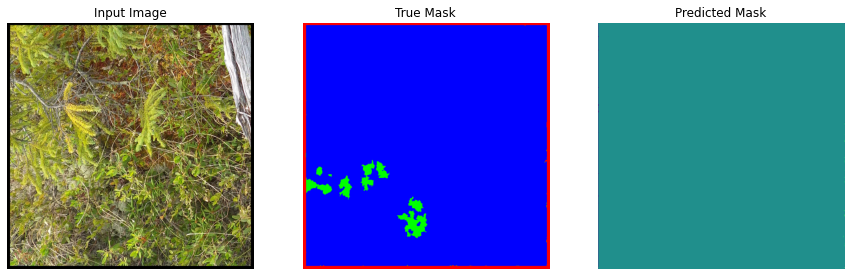

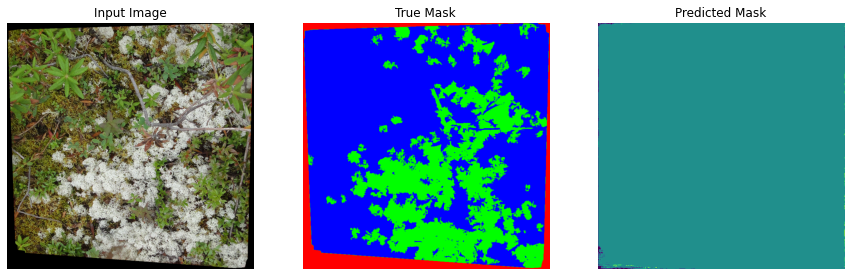

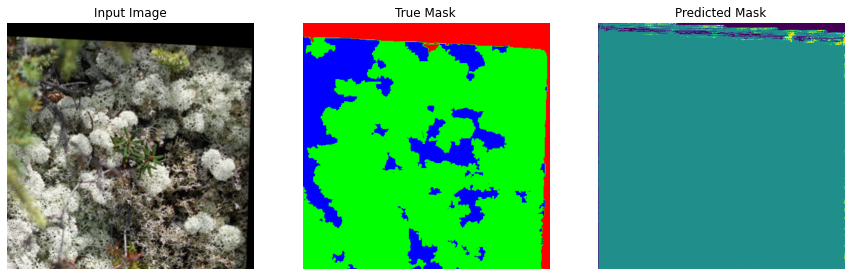

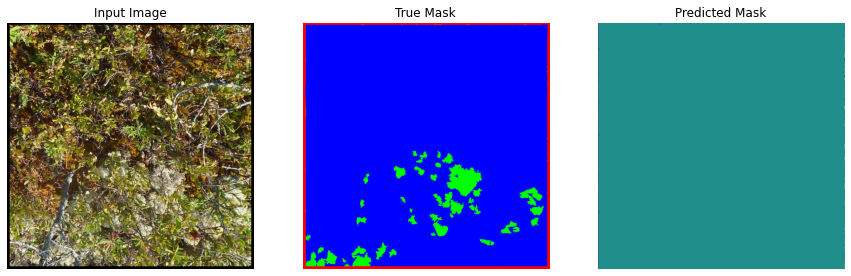

In [17]:
#SANITY CHECK to make sure the model is working
for image, mask in dataset['train'].take(4):
    sample_image, sample_mask = image, mask
    show_predictions()

In [18]:
#Setting up early stopping and model saving
model_file_name = "lichen_all_v3.h5"
callbacks = []
callbacks.append(tf.keras.callbacks.ModelCheckpoint(model_file_name, save_best_only=True, 
                                                   save_weights_only=True,))
callbacks.append(tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5))

epochs = 60
#MLFlow doesnt seem to work, activate code and indent
#model_history function and call to see error
'''mlflow.set_tracking_uri(str(project_dir / "mlruns"))
with mlflow.start_run():
    # Automatically log model/training parameters.
    mlflow.tensorflow.autolog(every_n_iter=1)'''
with tf.device('/gpu:0'):
    model_history = model.fit(dataset['train'], epochs=epochs,
                    steps_per_epoch=800,
                    validation_steps=25,
                    validation_data=dataset['val'],
                    callbacks=callbacks)
model_history

Epoch 1/60
800/800 [==============================] - 262s 299ms/step - loss: 0.9786 - acc: 0.7288 - dice_coef: 0.6538 - iou_coef: 0.4949 - val_loss: 0.7613 - val_acc: 0.7513 - val_dice_coef: 0.7044 - val_iou_coef: 0.5482
Epoch 2/60
800/800 [==============================] - 239s 298ms/step - loss: 0.7235 - acc: 0.8038 - dice_coef: 0.7259 - iou_coef: 0.5756 - val_loss: 0.7334 - val_acc: 0.7690 - val_dice_coef: 0.7247 - val_iou_coef: 0.5730
Epoch 3/60
800/800 [==============================] - 241s 302ms/step - loss: 0.6651 - acc: 0.8225 - dice_coef: 0.7455 - iou_coef: 0.6003 - val_loss: 0.6953 - val_acc: 0.7730 - val_dice_coef: 0.7291 - val_iou_coef: 0.5769
Epoch 4/60
800/800 [==============================] - 239s 299ms/step - loss: 0.6293 - acc: 0.8345 - dice_coef: 0.7517 - iou_coef: 0.6079 - val_loss: 0.6258 - val_acc: 0.8287 - val_dice_coef: 0.7467 - val_iou_coef: 0.5999
Epoch 5/60
800/800 [==============================] - 238s 298ms/step - loss: 0.5878 - acc: 0.8514 - dice_coef: 

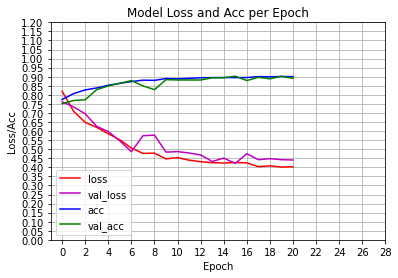

In [19]:
epoch = (range(30))
end = 30
#int(str(epoch)[-4:-1])

plt.plot(model_history.history['loss'],'r')
plt.plot(model_history.history['val_loss'],'m')
plt.plot(model_history.history['acc'],'b')
plt.plot(model_history.history['val_acc'],'g')
plt.grid()

#plt.plot(history.history['val_loss'])
plt.title('Model Loss and Acc per Epoch')
plt.ylabel('Loss/Acc')
#plt.axes([0, 0, 10, 0.5])
plt.yticks(np.arange(0, 1.25, 0.05))
plt.xticks(np.arange(0,end,2))

plt.xlabel('Epoch')
plt.legend(['loss','val_loss','acc','val_acc'], loc='lower left')
plt.savefig('D:\GIS\Gov_coop\TFreading.jpg',dpi=300)
plt.show()

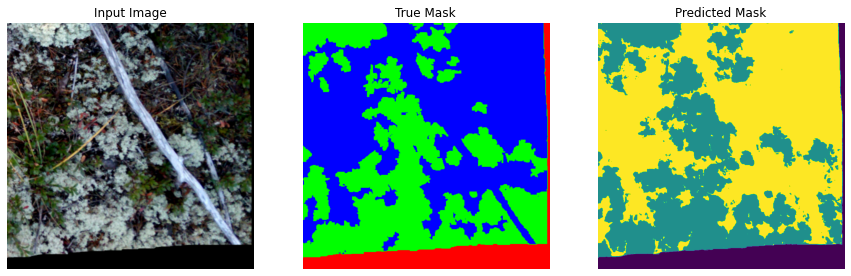

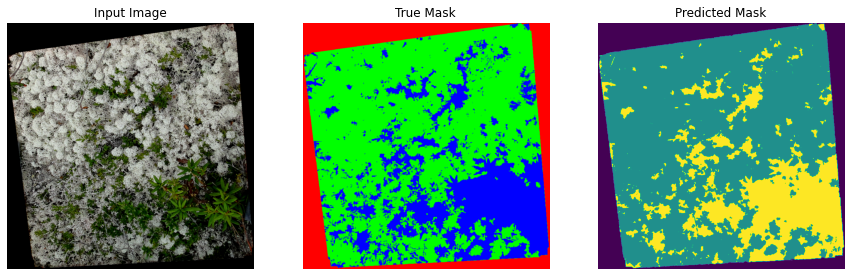

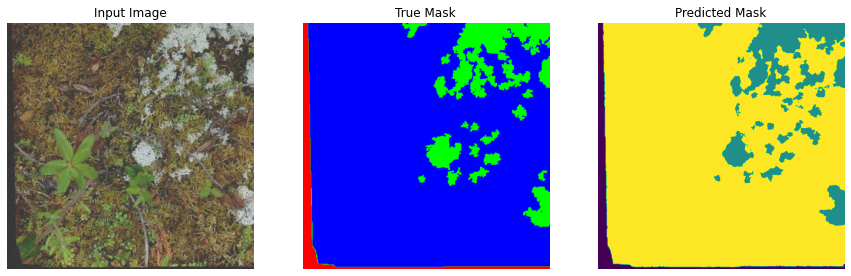

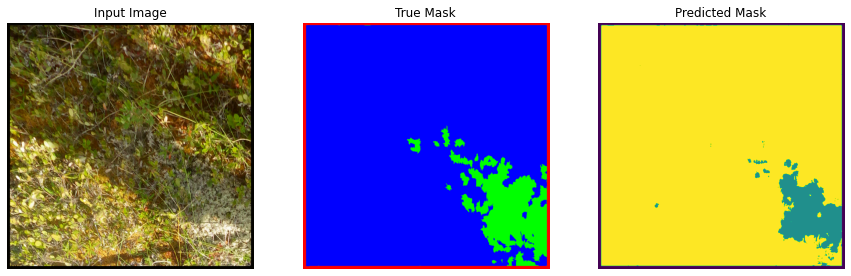

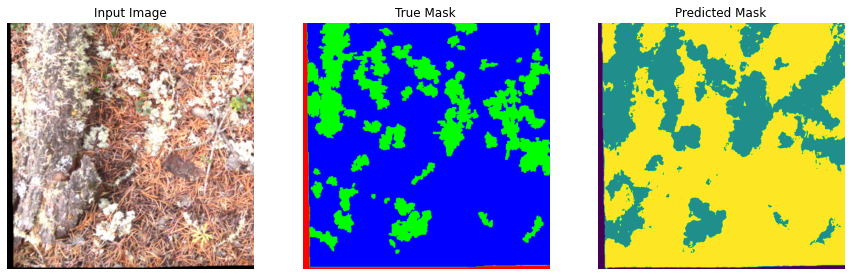

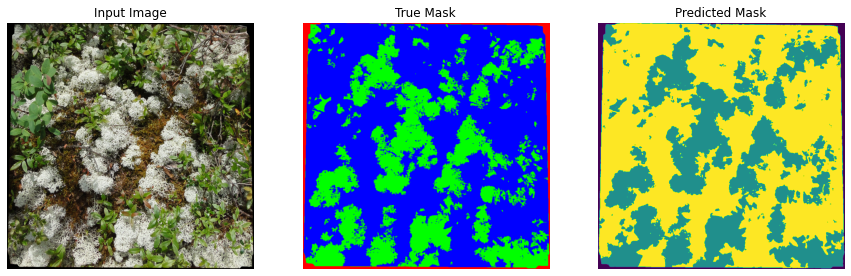

In [20]:
#displaying the results from 3 images
for image, mask in dataset['train'].take(6):
    sample_image, sample_mask = image, mask
    show_predictions()

## Analyze performance on the test set

In [21]:
test_data = list(dataset['test'].as_numpy_iterator())

In [27]:
#rof2.h5
#rof_pure_3.h5
#lichen_all_v2.h5
model_file_name = r"C:\Users\gamr0\01_TF Testing\TF_Iterations\lichen_all_v3.h5"
model.load_weights(model_file_name)

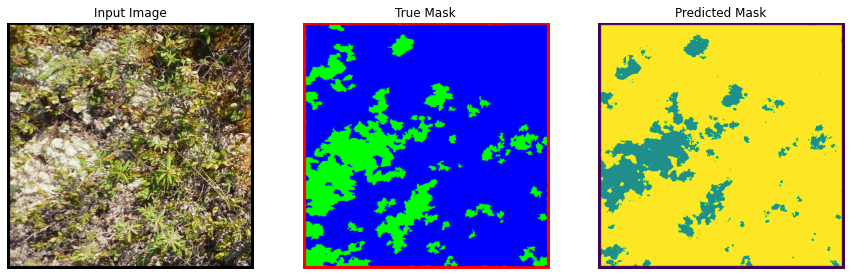

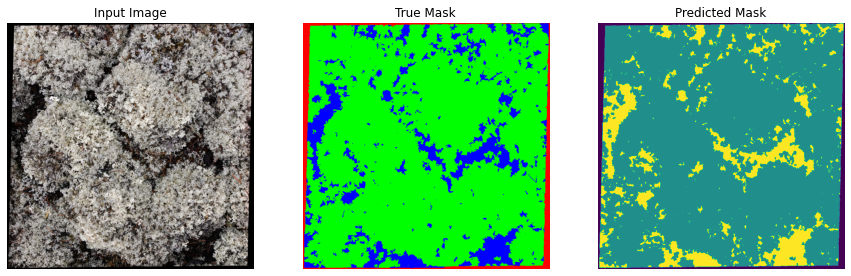

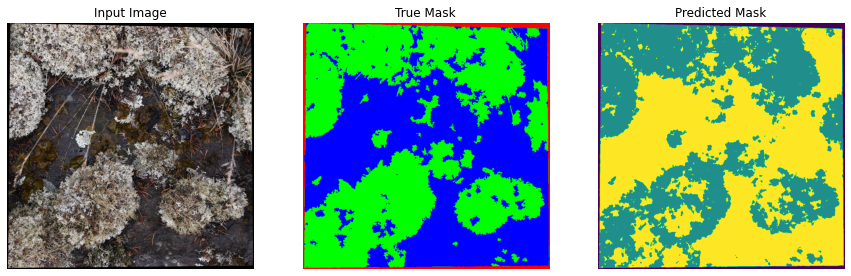

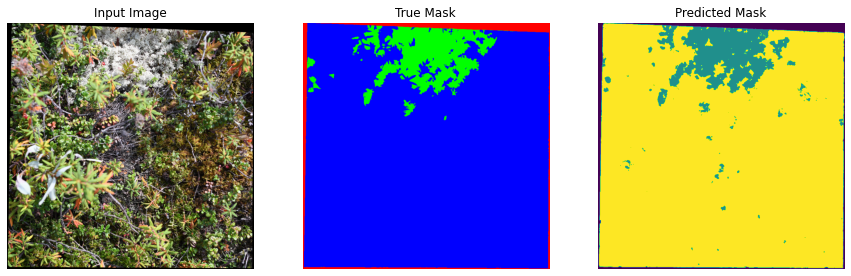

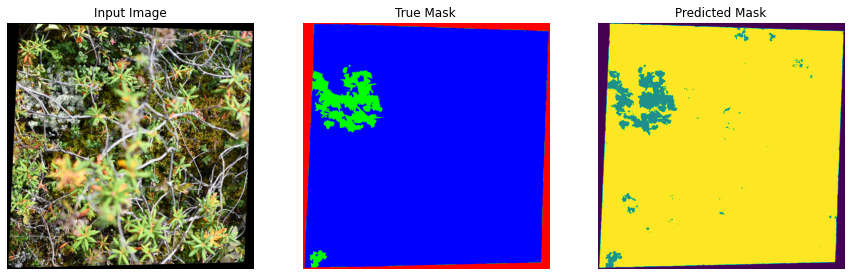

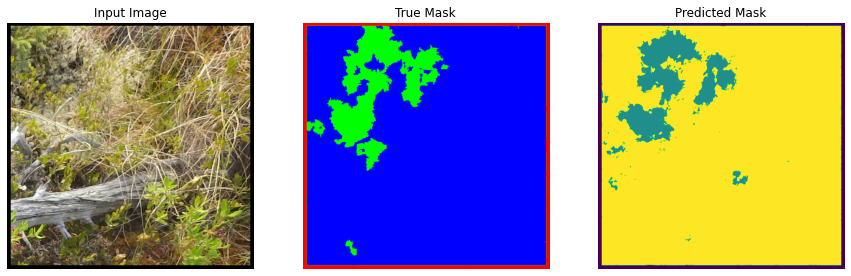

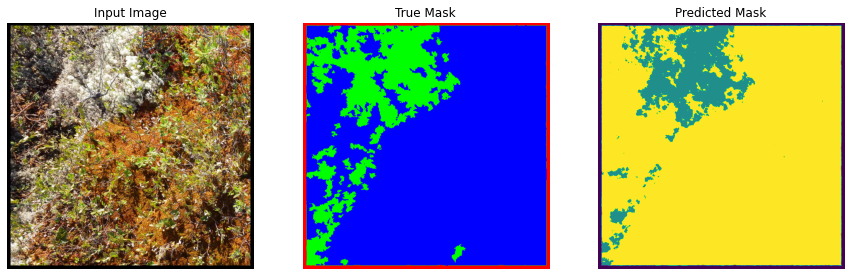

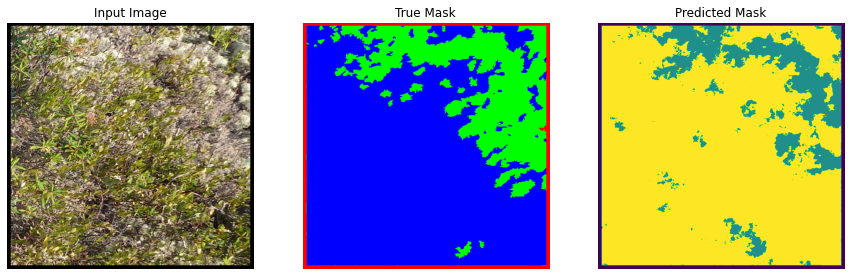

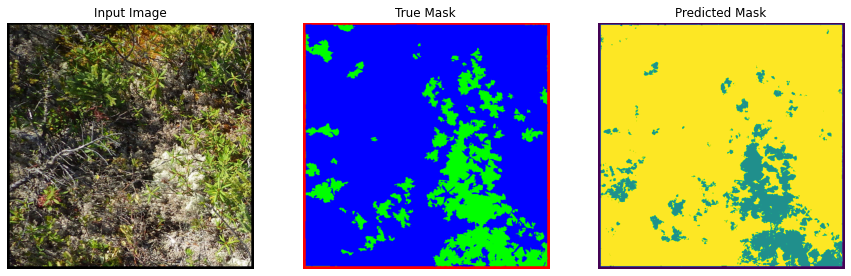

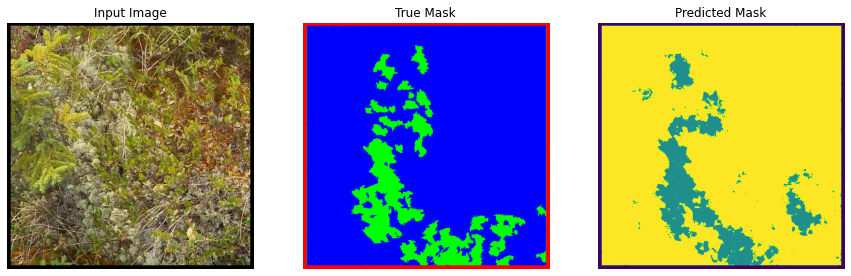

In [28]:
#displaying the results from 3 images
for image, mask in dataset['test'].take(10):
    sample_image, sample_mask = image, mask
    show_predictions()

In [29]:
import pandas as pd

results = []
indices = []
for i, data in enumerate(test_data):
    sample_image, sample_mask = data
    results.append(model.evaluate(sample_image, sample_mask, verbose=0))
    indices.append(i)
    
df_results = pd.DataFrame(results, columns=["Loss", "Accuracy", "dice_coef", "iou_coef"], index=indices)

In [30]:
df_results.head(6)

,Loss,Accuracy,dice_coef,iou_coef
0,0.410330,0.903253,0.843965,0.730051
1,0.375104,0.934375,0.803484,0.671520
2,0.468673,0.891100,0.798580,0.664696
3,0.142333,0.978108,0.924216,0.859109
4,0.138721,0.980359,0.924459,0.859529
5,0.269408,0.945273,0.875755,0.778971


In [31]:
df_results.describe()

,Loss,Accuracy,dice_coef,iou_coef
count,23.000000,23.000000,23.000000,23.000000
mean,0.379392,0.915040,0.837048,0.723146
std,0.133714,0.037001,0.052520,0.078429
min,0.138721,0.840819,0.752504,0.603212
25%,0.308986,0.893329,0.801032,0.668108
50%,0.385221,0.910116,0.835111,0.716902
75%,0.470370,0.936966,0.880074,0.785860
max,0.648940,0.980359,0.924459,0.859529


<AxesSubplot:ylabel='Frequency'>

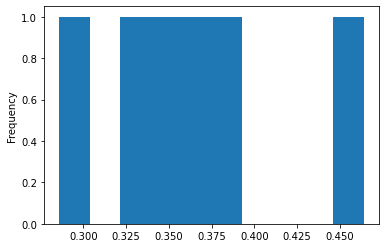

In [26]:
df_results["Loss"].plot.hist()

<AxesSubplot:ylabel='Frequency'>

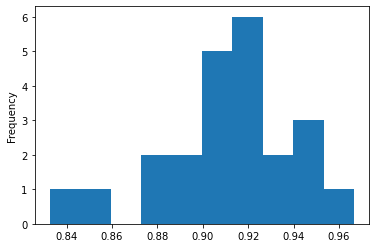

In [29]:
df_results["Accuracy"].plot.hist()

<AxesSubplot:ylabel='Frequency'>

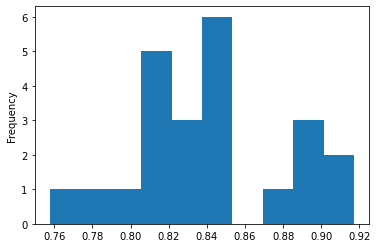

In [30]:
df_results["dice_coef"].plot.hist()

<AxesSubplot:ylabel='Frequency'>

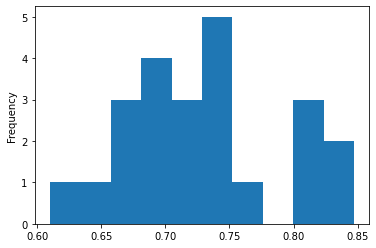

In [31]:
df_results["iou_coef"].plot.hist()

In [32]:
df_results.sort_values(by="dice_coef").head(5)

,Loss,Accuracy,dice_coef,iou_coef
13,0.558891,0.853920,0.757675,0.609885
16,0.626570,0.832634,0.787276,0.649179
14,0.459470,0.888234,0.796418,0.661706
11,0.400887,0.914794,0.806355,0.675541
10,0.468255,0.879381,0.810183,0.680930


In [33]:
df_results.sort_values(by="Loss", ascending=False).head(5)

,Loss,Accuracy,dice_coef,iou_coef
16,0.626570,0.832634,0.787276,0.649179
13,0.558891,0.853920,0.757675,0.609885
20,0.494932,0.894561,0.811352,0.682583
10,0.468255,0.879381,0.810183,0.680930
14,0.459470,0.888234,0.796418,0.661706


In [34]:
df_results.sort_values(by="Accuracy").head(5)

,Loss,Accuracy,dice_coef,iou_coef
16,0.626570,0.832634,0.787276,0.649179
13,0.558891,0.853920,0.757675,0.609885
10,0.468255,0.879381,0.810183,0.680930
22,0.418723,0.885584,0.829416,0.708549
14,0.459470,0.888234,0.796418,0.661706


Predictions for image 16 with loss 0.6265698075294495.


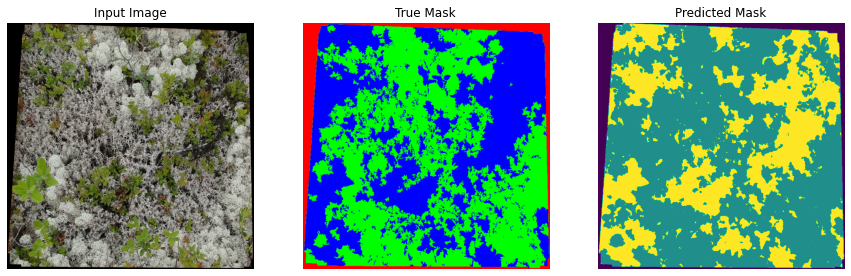

Predictions for image 13 with loss 0.5588914155960083.


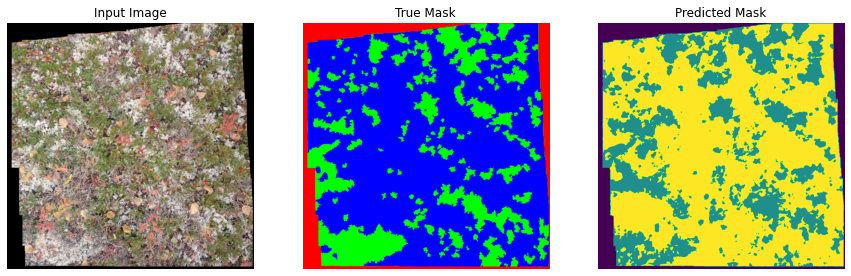

Predictions for image 20 with loss 0.4949319064617157.


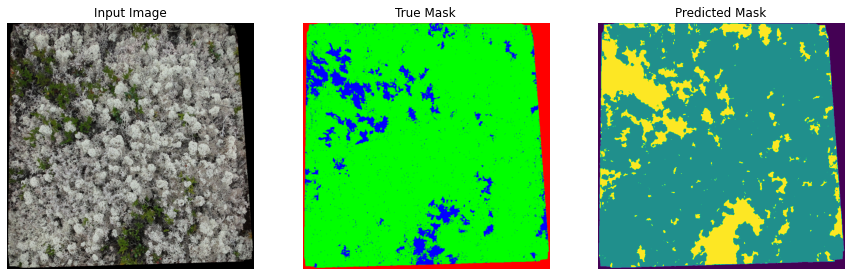

In [35]:
# Input image with worst Loss.
for i in df_results.sort_values(by="Loss", ascending=False)[0:3].index.values:
    print(f"Predictions for image {i} with loss {df_results.loc[i, 'Loss']}.")
    sample_image, sample_mask = test_data[i]
    show_predictions()

Predictions for image 13 with f1 score 0.7576754093170166.
Predictions for image 13.


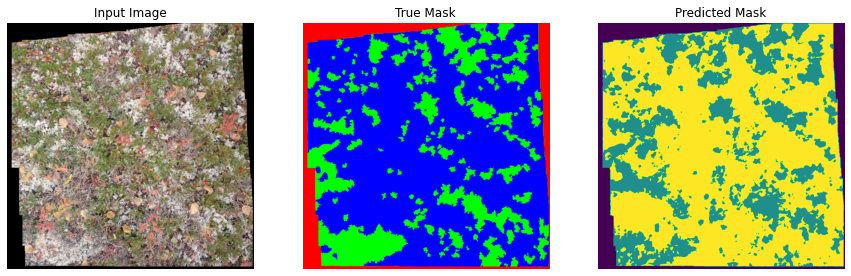

Predictions for image 16 with f1 score 0.7872756123542786.
Predictions for image 16.


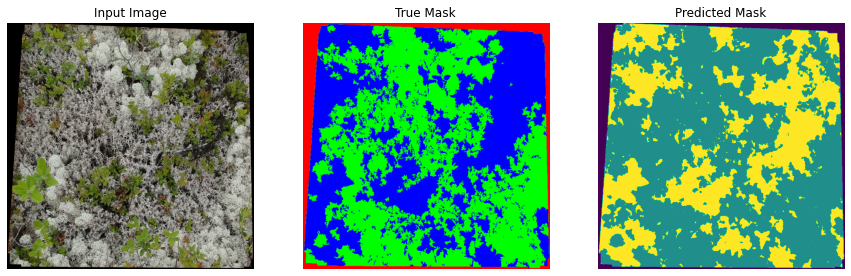

Predictions for image 14 with f1 score 0.7964178919792175.
Predictions for image 14.


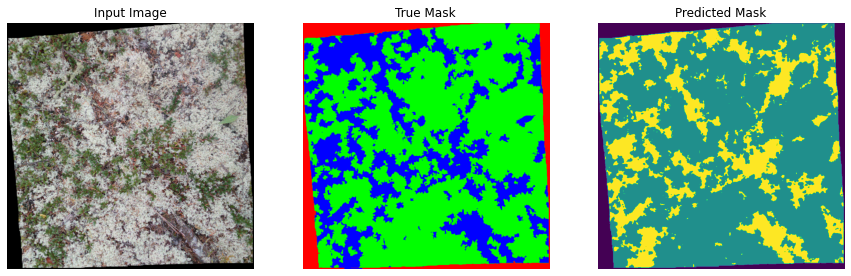

In [36]:
# Input image with worst dice score.
for i in df_results.sort_values(by="dice_coef")[0:3].index.values:
    print(f"Predictions for image {i} with f1 score {df_results.loc[i, 'dice_coef']}.")
    print(f"Predictions for image {i}.")
    sample_image, sample_mask = test_data[i]
    show_predictions()

Predictions for image 16 with accuracy 0.8326343894004822.


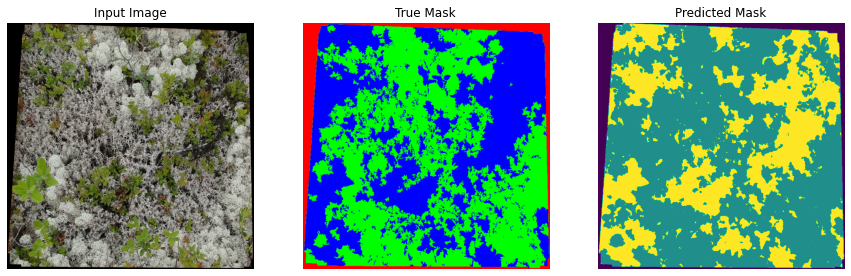

Predictions for image 13 with accuracy 0.8539203405380249.


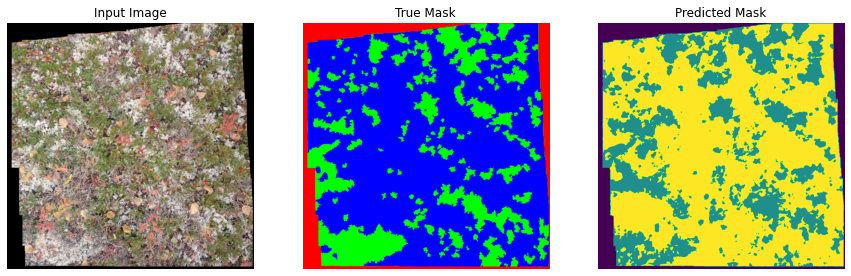

Predictions for image 10 with accuracy 0.8793812394142151.


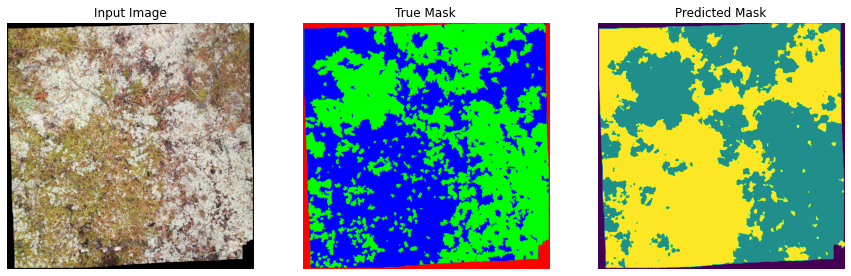

In [37]:
# Input image with worst accuracy.
for i in df_results.sort_values(by="Accuracy")[0:3].index.values:
    print(f"Predictions for image {i} with accuracy {df_results.loc[i, 'Accuracy']}.")
    sample_image, sample_mask = test_data[i]
    show_predictions()

## New image augmentations

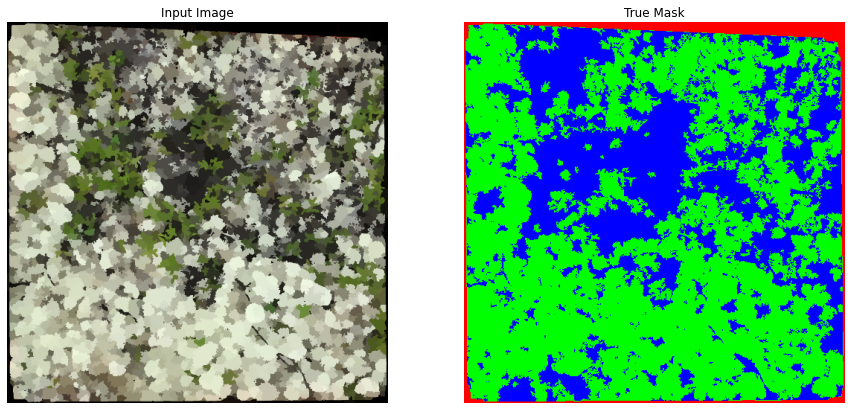

In [70]:
index = 0
display_sample([sample_image[index], sample_mask[index]])

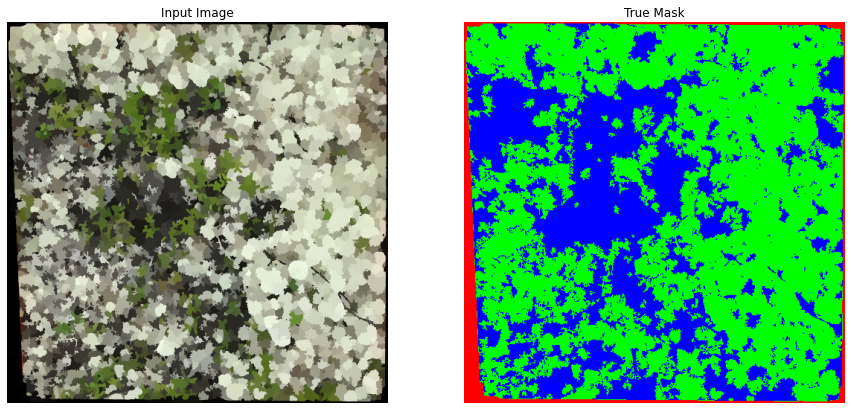

In [71]:
my_image = tf.image.transpose(sample_image[index]) 
my_mask = tf.image.transpose(sample_mask[index])
display_sample([my_image, my_mask])

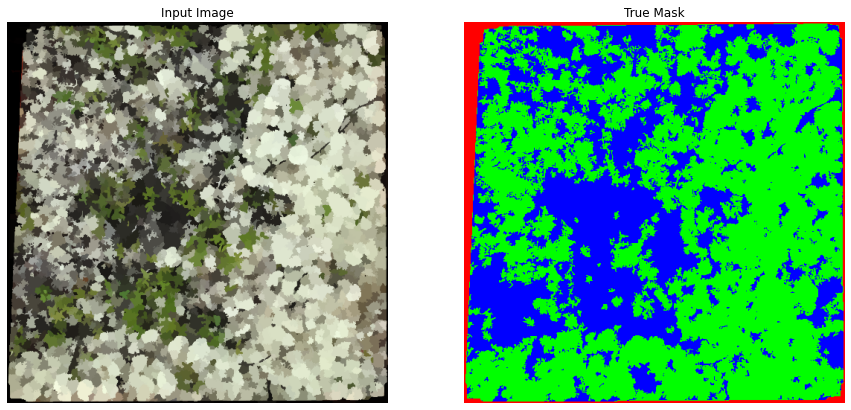

In [72]:
my_image = tf.image.rot90(sample_image[index], k=1, name=None) 
my_mask = tf.image.rot90(sample_mask[index], k=1, name=None)
display_sample([my_image, my_mask])

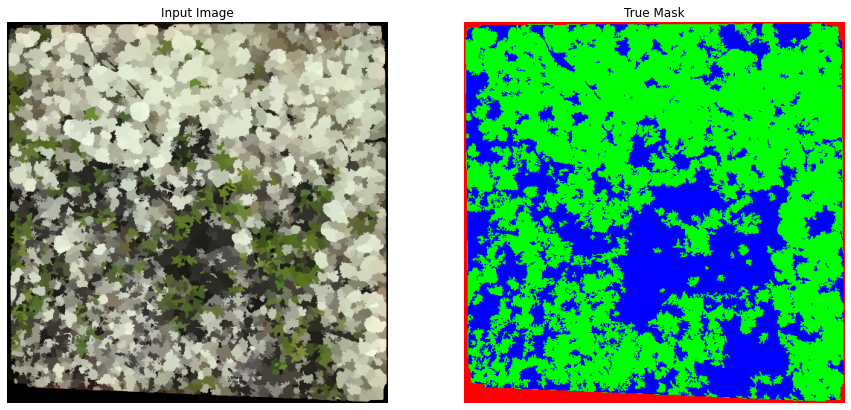

In [73]:
my_image = tf.image.rot90(sample_image[index], k=2, name=None) 
my_mask = tf.image.rot90(sample_mask[index], k=2, name=None)
display_sample([my_image, my_mask])

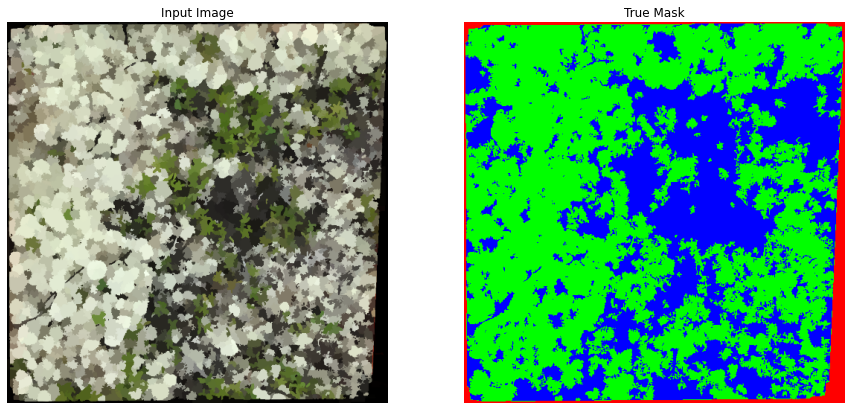

In [74]:
my_image = tf.image.rot90(sample_image[index], k=3, name=None) 
my_mask = tf.image.rot90(sample_mask[index], k=3, name=None)
display_sample([my_image, my_mask])

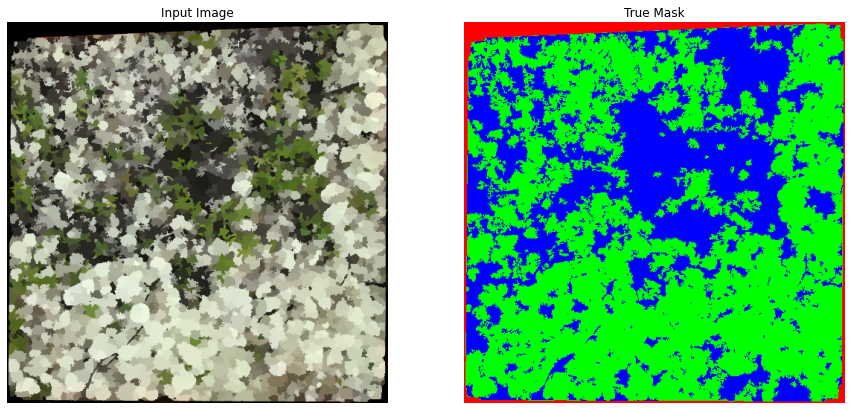

In [75]:
my_image = tf.image.flip_left_right(sample_image[index]) 
my_mask = tf.image.flip_left_right(sample_mask[index])
display_sample([my_image, my_mask])

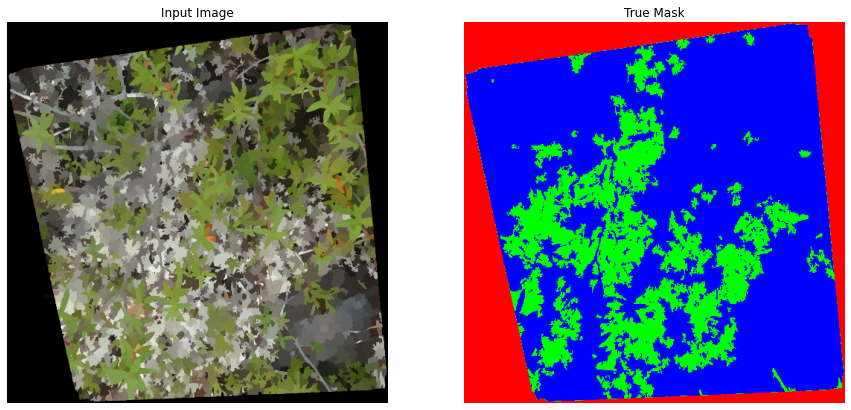

In [178]:
my_image = tf.image.flip_up_down(sample_image[index]) 
my_mask = tf.image.flip_up_down(sample_mask[index])
display_sample([my_image, my_mask])

In [76]:
def apply_sym(image, mask, i):
    if i == 0:
        return image, mask
    elif i == 1:
        return tf.image.transpose(image),  tf.image.transpose(mask)
    elif i == 2:
        return tf.image.rot90(image, k=1, name=None), tf.image.rot90(mask, k=1, name=None)
    elif i == 3:
        return tf.image.rot90(image, k=2, name=None), tf.image.rot90(mask, k=2, name=None) 
    elif i ==4:
        return tf.image.rot90(image, k=3, name=None), tf.image.rot90(mask, k=3, name=None)
    elif i == 5:
        return tf.image.flip_left_right(image), tf.image.flip_left_right(mask)
    elif i == 6:
        return tf.image.flip_up_down(image), tf.image.flip_up_down(mask)

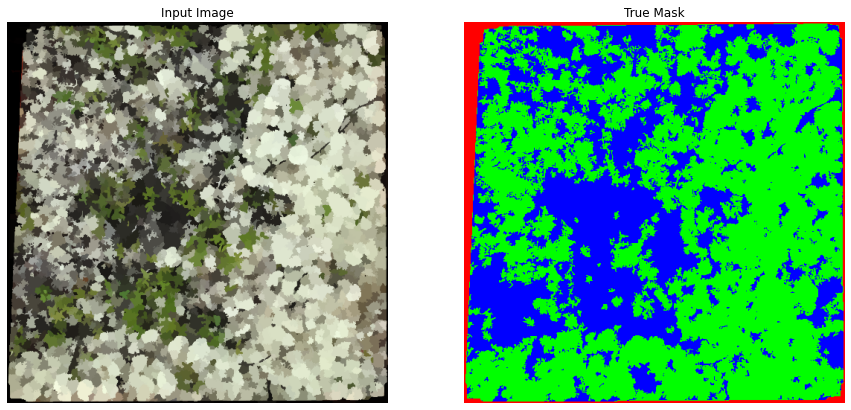

In [77]:
# Test the above function:
display_sample(apply_sym(sample_image[index], sample_mask[index], 2))

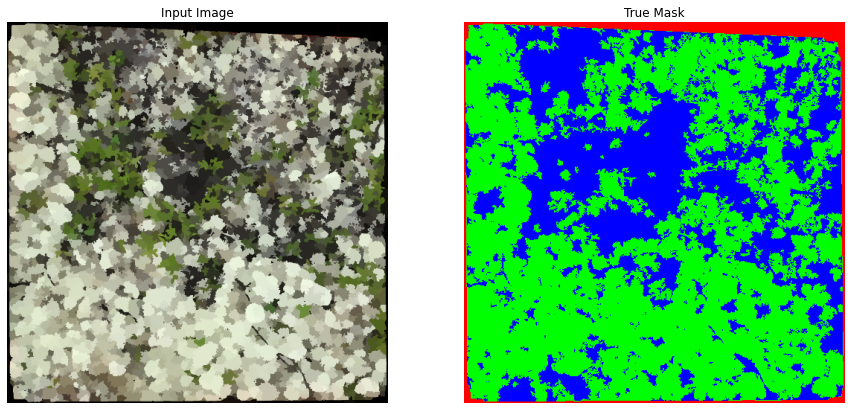

In [78]:
display_sample([sample_image[index], sample_mask[index]])

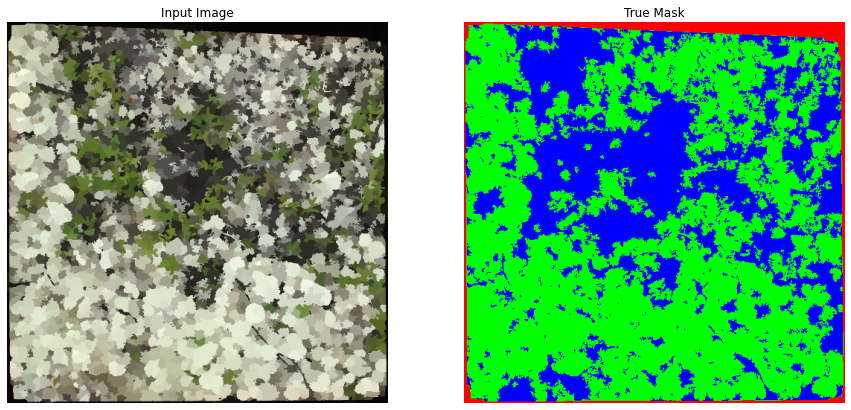

In [79]:
display_sample([tf.image.random_brightness(sample_image[index], 0.2), sample_mask[index]])

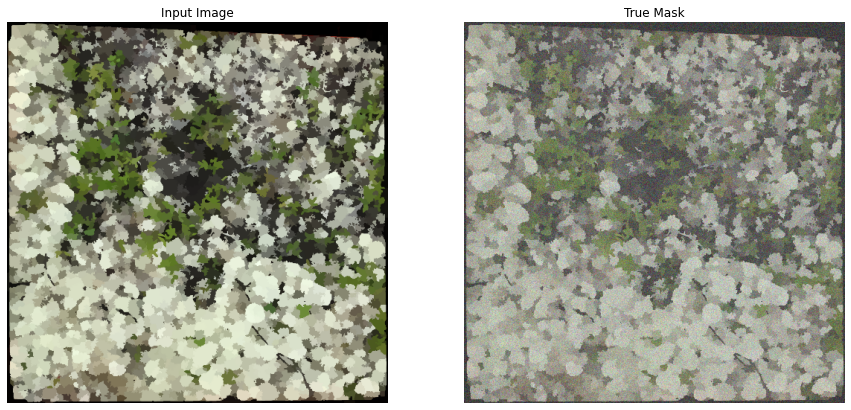

In [80]:
# Adding Gaussian noise to image
common_type = tf.float32 # Make noise and image of the same type
gnoise = tf.random.normal(shape=tf.shape(sample_image[index]), mean=0.0, stddev=0.1, dtype=common_type)
image_type_converted = tf.image.convert_image_dtype(sample_image[index], dtype=common_type, saturate=False)
noisy_image = tf.add(image_type_converted, gnoise)
display_sample([image_type_converted, noisy_image])